# 🌳 SelvaSonic-ML — Demo Final
### Clasificador Bioacústico de Aves Amazónicas

**Universidad Nacional de Colombia — Sede Medellín**  
Aprendizaje Automático (Prof. Alcides Montoya)

**Autores:** Laura Ruiz Arango · Jose Aldair Molina Méndez  
**Fecha:** Junio 2026  
**Repositorio:** [github.com/LauraRuizA09/SelvaSonic-ML](https://github.com/LauraRuizA09/SelvaSonic-ML)

---

> *"Escuchando la Amazonía con Machine Learning"*

Este notebook es la **demostración ejecutiva** del proyecto: arquitectura, resultados, demo en vivo, hallazgos y limitaciones.  
Para los análisis técnicos detallados, ver los notebooks 04–16.

## Resumen Ejecutivo

SelvaSonic-ML es un clasificador bioacústico que identifica vocalizaciones de **10 especies de aves amazónicas colombianas** y detecta sonidos no-ave. El sistema segmenta grabaciones de campo en clips de 5 segundos, computa espectrogramas Mel de 128 bandas y los clasifica mediante una CNN entrenada desde cero con módulo de atención Multi-Head Self-Attention (MHSA).

La arquitectura ganadora (**Attention v2**) agrega *class weights* inversamente proporcionales a la frecuencia de clase y *label smoothing* (α=0.1) para manejar el severo desbalance de clases. Sobre el conjunto de test alcanza **70.36% de accuracy en 11 clases**, superando al baseline CNN puro (63.2%) en 7.1 puntos porcentuales.

---
## Setup

Importaciones, paleta de colores, rutas a checkpoints y audios de demo. La celda verifica que todos los recursos existen antes de continuar.

In [1]:
from __future__ import annotations
import json
import sys
from pathlib import Path

import numpy as np
import torch
import matplotlib.pyplot as plt
from IPython.display import display, Image, Audio

# --- Path setup: el notebook corre desde notebooks/ ---
_nb_dir = Path().resolve()
ROOT = _nb_dir.parent if (_nb_dir.parent / 'src').is_dir() else _nb_dir
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

from src.inference import predict_audio, AudioPrediction, ClipPrediction
from src.audio_io import load_audio
from src.transforms import compute_mel_spectrogram
from src.config import NUM_CLASSES, SAMPLE_RATE, CLIP_DURATION_S, N_MELS, HOP_LENGTH

# --- Paleta del proyecto ---
COLOR_PRIMARY   = '#6C5CE7'
COLOR_SECONDARY = '#00CEC9'
COLOR_ACCENT    = '#FD79A8'
COLOR_BG        = '#FAFAFA'
COLOR_TEXT      = '#2D3436'
COLOR_NEUTRAL   = '#B2BEC3'

# --- Matplotlib global ---
plt.rcParams.update({
    'figure.dpi': 150,
    'figure.facecolor': COLOR_BG,
    'axes.facecolor': COLOR_BG,
    'axes.edgecolor': COLOR_TEXT,
    'axes.labelcolor': COLOR_TEXT,
    'axes.titlecolor': COLOR_TEXT,
    'xtick.color': COLOR_TEXT,
    'ytick.color': COLOR_TEXT,
    'font.family': 'sans-serif',
    'axes.grid': True,
    'grid.alpha': 0.3,
    'grid.linestyle': '--',
})

# --- Semilla ---
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)

# --- Device ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# --- Checkpoints ---
RUTA_BASELINE = ROOT / 'results/runs/baseline_S3_v2_20260527_0118/best.pth'
RUTA_ATT_V1   = ROOT / 'results/runs/attention_S4_v1_20260601_0334/best.pth'
RUTA_ATT_V2   = ROOT / 'results/runs/attention_S4_v2_20260602_1332/best.pth'

CHECKPOINTS = {
    'baseline':     RUTA_BASELINE,
    'attention_v1': RUTA_ATT_V1,
    'attention_v2': RUTA_ATT_V2,
}

# --- Audios de demo ---
AUDIO_DEMO_1 = ROOT / 'data/raw/Crypturellus_cinereus/XC743526.mp3'
AUDIO_DEMO_2 = ROOT / 'data/external_test/PUERTO_NARINO1_REC9_EXTRACTED/AUDIOS_LEVELED/1_PuertoNarino1_9_06-20-RX11Co_01.wav'
AUDIO_DEMO_3 = ROOT / 'data/raw/ESC-50/rain/1-17367-A-10.wav'

# --- Verificacion ---
for _ruta in [RUTA_BASELINE, RUTA_ATT_V1, RUTA_ATT_V2,
              AUDIO_DEMO_1, AUDIO_DEMO_2, AUDIO_DEMO_3]:
    assert _ruta.exists(), f'NO existe: {_ruta}'

print(f'ROOT:        {ROOT}')
print(f'Dispositivo: {device}')
print(f'NUM_CLASSES={NUM_CLASSES} | SAMPLE_RATE={SAMPLE_RATE} Hz | CLIP={CLIP_DURATION_S}s | N_MELS={N_MELS}')
print('Checkpoints:')
for k, v in CHECKPOINTS.items():
    print(f'  {k}: {v.name}')
print('Audios de demo:')
for a in [AUDIO_DEMO_1, AUDIO_DEMO_2, AUDIO_DEMO_3]:
    print(f'  {a.name}')
print('\n✅ Todos los recursos verificados')

ROOT:        C:\Users\Usuario\Desktop\SelvaSonic - Project ML\SelvaSonic ML
Dispositivo: cpu
NUM_CLASSES=11 | SAMPLE_RATE=22050 Hz | CLIP=5.0s | N_MELS=128
Checkpoints:
  baseline: best.pth
  attention_v1: best.pth
  attention_v2: best.pth
Audios de demo:
  XC743526.mp3
  1_PuertoNarino1_9_06-20-RX11Co_01.wav
  1-17367-A-10.wav

✅ Todos los recursos verificados


---
## Sección 1: El Problema

**Contexto bioacústico:** La Amazonía colombiana alberga 1,627 especies de aves registradas — la mayor diversidad por unidad de área en el planeta. Monitorear la salud de este ecosistema requiere identificar miles de cantos diariamente. Hoy ese trabajo depende de expertos humanos escasos, costosos y geográficamente limitados. Los sistemas de grabación autónomos (como los usados en Puerto Nariño, Amazonas) generan cientos de horas de audio que nadie alcanza a escuchar manualmente.

**El reto técnico:** Clasificar 10 especies amazónicas + la clase *no_ave* a partir de grabaciones cortas de campo, manejando desbalance severo (*no_ave* tiene 1,600+ clips; algunas especies tienen solo 18–48 archivos), condiciones acústicas variables (lluvia, viento, fauna de fondo) y la necesidad de que el sistema sea interpretable.

**Por qué desde cero:** El proyecto anterior (presentado en el XVIII Congreso de Ingeniería Física) usó modelos preentrenados (YAMNet, AST). Esta versión entrena una CNN propia desde cero para ganar control completo del pipeline, interpretabilidad vía Grad-CAM, y comprensión profunda de qué aprende el modelo — la diferencia entre usar una caja negra y entender el problema.

---
## Sección 2: El Dataset

El dataset combina dos fuentes públicas:
- **Xeno-canto:** grabaciones de aves amazónicas colombianas descargadas por especie y segmentadas en clips de 5 segundos con overlap del 50% en entrenamiento.
- **ESC-50:** 2,000 sonidos ambientales (Environmental Sound Classification) usados como clase negativa (*no_ave*). Cada archivo ESC-50 dura exactamente 5 segundos = 1 clip.

El desbalance de clases es el **desafío central** del proyecto. La siguiente gráfica muestra la distribución de clips en el conjunto de entrenamiento:

Fuente: clips de entrenamiento


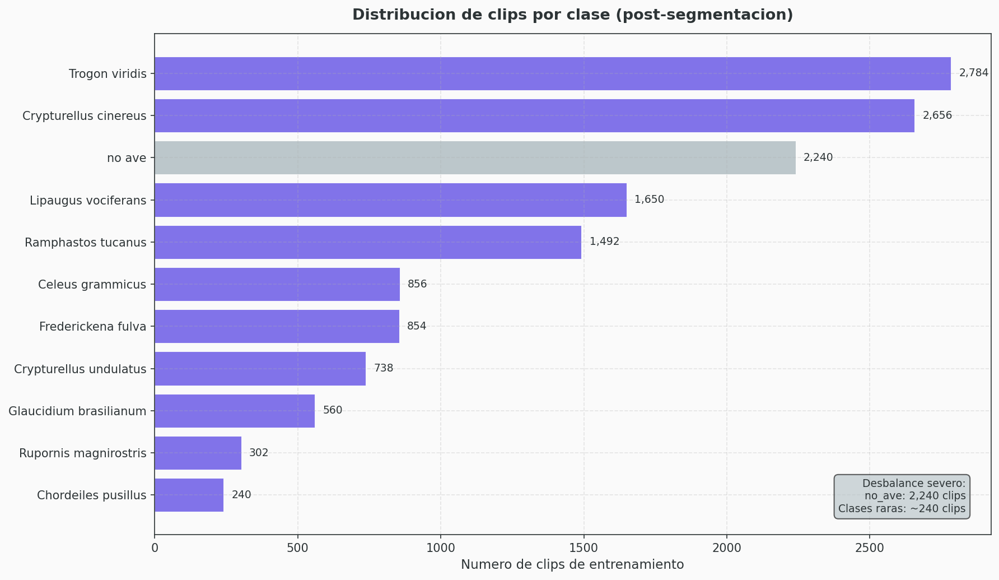

Clases: 11 | Total clips: 14,372


In [2]:
# Cargar conteos de clips desde class_weights.pt (generado por calcular_class_weights.py)
_cw_path = ROOT / 'data' / 'class_weights.pt'
try:
    _cw     = torch.load(str(_cw_path), weights_only=False)
    _cc_raw = _cw['class_counts']
    _lmap   = _cw.get('label_map', {})
    if isinstance(_cc_raw, torch.Tensor):
        _idx_to_name = {v: k for k, v in _lmap.items()}
        class_counts = {_idx_to_name[i]: int(_cc_raw[i].item())
                        for i in range(len(_cc_raw))}
    elif isinstance(_cc_raw, dict):
        class_counts = _cc_raw
    else:
        raise ValueError(f'Formato inesperado: {type(_cc_raw)}')
    _source_label = 'clips de entrenamiento'
except Exception as _e:
    print(f'  class_weights.pt no disponible ({_e}). Contando archivos...')
    _raw = ROOT / 'data' / 'raw'
    class_counts = {}
    for _d in sorted(_raw.iterdir()):
        if _d.is_dir() and _d.name != 'ESC-50':
            class_counts[_d.name] = len(list(_d.glob('*.mp3')))
    _esc50 = _raw / 'ESC-50'
    if _esc50.exists():
        class_counts['no_ave'] = len(list(_esc50.rglob('*.wav')))
    _source_label = 'archivos de audio (aprox. clips)'

print(f'Fuente: {_source_label}')

# Ordenar descendente
_sorted  = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)
_classes = [c for c, _ in _sorted]
_counts  = [n for _, n in _sorted]
_colors  = [COLOR_NEUTRAL if c == 'no_ave' else COLOR_PRIMARY for c in _classes]

fig, ax = plt.subplots(figsize=(12, 7))
bars = ax.barh(range(len(_classes)), _counts, color=_colors,
               alpha=0.85, edgecolor='white', linewidth=0.5)
ax.set_yticks(range(len(_classes)))
ax.set_yticklabels([c.replace('_', ' ') for c in _classes], fontsize=10)
ax.invert_yaxis()
ax.set_xlabel(f'Numero de {_source_label}', fontsize=11)
ax.set_title('Distribucion de clips por clase (post-segmentacion)',
             fontsize=13, fontweight='bold', pad=12)

_max_c = max(_counts)
for bar, count in zip(bars, _counts):
    ax.text(count + _max_c * 0.01, bar.get_y() + bar.get_height() / 2,
            f'{count:,}', va='center', fontsize=9, color=COLOR_TEXT)

_no_ave_n = class_counts.get('no_ave', 0)
_ave_vals  = [v for k, v in class_counts.items() if k != 'no_ave']
_min_ave   = min(_ave_vals) if _ave_vals else 0
ax.annotate(
    f'Desbalance severo:\nno_ave: {_no_ave_n:,} clips\nClases raras: ~{_min_ave} clips',
    xy=(0.97, 0.04), xycoords='axes fraction', ha='right', va='bottom', fontsize=9,
    color=COLOR_TEXT,
    bbox=dict(boxstyle='round,pad=0.4', facecolor=COLOR_NEUTRAL, alpha=0.6),
)

plt.tight_layout()
plt.show()
print(f'Clases: {len(_classes)} | Total clips: {sum(_counts):,}')

**Leccion del desbalance:** Un modelo ingenuo que siempre prediga *no_ave* alcanzaria accuracy ~38% sin aprender nada. Esto motiva los **class weights** en Attention v2: los errores en clases raras (*Rupornis*, *Celeus*) valen hasta **5.4× mas** que los errores en la clase mayoritaria, forzando al modelo a aprenderlas.

---
## Sección 3: Pipeline de Machine Learning

El pipeline convierte audio crudo en predicciones en 4 pasos:

1. **Carga y normalizacion:** mono, 22,050 Hz
2. **Segmentacion en clips de 5s:** sin solapamiento en inferencia (overlap 50% solo en entrenamiento)
3. **Mel-spectrograma:** 128 bandas Mel, ventana FFT de 2048 muestras (~93ms), hop de 512 (~23ms) → tensor `[1, 128, T]`
4. **CNN + MHSA:** 11 probabilidades softmax

La siguiente figura muestra el Mel-spectrograma del **Timamu cenizo** (*Crypturellus cinereus*) — primer clip de 5s de una grabacion Xeno-canto:

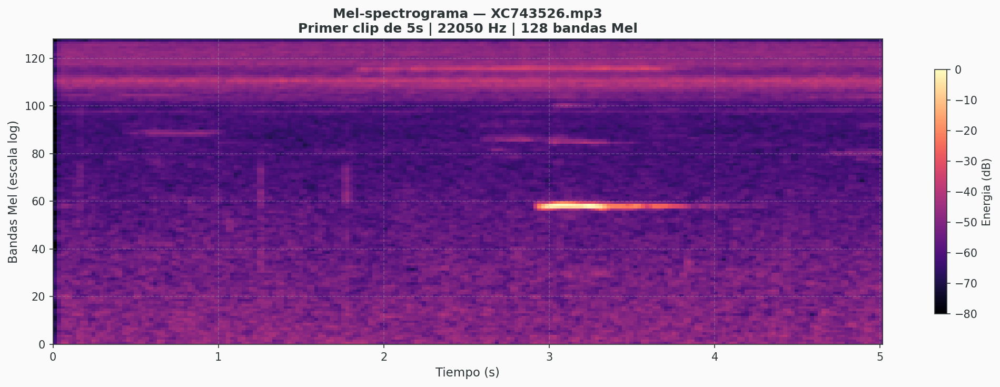

Duracion del clip: 5.02s | Frames: 216 | Shape tensor: [1, 128, 216]

 Reproducir audio:


In [3]:
_audio1 = load_audio(AUDIO_DEMO_1)
_n_5s   = int(CLIP_DURATION_S * _audio1.sample_rate)
_wav5s  = _audio1.waveform[:_n_5s]

_mel  = compute_mel_spectrogram(_wav5s, sr=_audio1.sample_rate)  # (128, T)
_T    = _mel.shape[1]
_dur  = _T * HOP_LENGTH / _audio1.sample_rate

fig, ax = plt.subplots(figsize=(14, 5))
img = ax.imshow(_mel, origin='lower', aspect='auto', cmap='magma',
                extent=[0, _dur, 0, N_MELS])
ax.set_xlabel('Tiempo (s)', fontsize=11)
ax.set_ylabel('Bandas Mel (escala log)', fontsize=11)
ax.set_title(
    f'Mel-spectrograma — {AUDIO_DEMO_1.name}\n'
    f'Primer clip de {CLIP_DURATION_S:.0f}s | {_audio1.sample_rate} Hz | {N_MELS} bandas Mel',
    fontsize=12, fontweight='bold',
)
fig.colorbar(img, ax=ax, label='Energia (dB)', shrink=0.8)
plt.tight_layout()
plt.show()

print(f'Duracion del clip: {_dur:.2f}s | Frames: {_T} | Shape tensor: [1, {N_MELS}, {_T}]')
print('\n Reproducir audio:')
display(Audio(_wav5s, rate=_audio1.sample_rate, normalize=True))

Las regiones brillantes (alta energia) corresponden a los **tonos puros sostenidos** caracteristicos del canto del Timamu cenizo — una serie de silbidos descendentes bien definidos en las bandas Mel medias (~30–80). Cada modelo recibe este tensor 2D `[1, 128, T]` y produce 11 probabilidades.

---
## Sección 4: Las 3 Arquitecturas

Cada version responde una pregunta metodologica:

| Caracteristica | Baseline | Attention v1 | Attention v2 (final) |
|---|---|---|---|
| CNN feature extractor | 4 bloques Conv2D + BN + ReLU + MaxPool | identico | identico |
| Multi-Head Self-Attention | No | Si — 4 heads | Si — 4 heads |
| Class weights (balanceo) | No | No | **Si** |
| Label smoothing alfa | 0 | 0 | **0.1** |
| Parametros entrenables | 422,635 | 714,987 | 714,987 |
| val_acc (best) | 0.7419 | 0.7829 | 0.7653 |
| **test_acc** | 0.6322 | 0.6873 | **0.7036** |

**Progresion metodologica:** Baseline establece la linea base CNN-only. Attention v1 agrega MHSA — captura dependencias de largo alcance en el espectrograma y gana +5.5 pp en test. Attention v2 ataca el desbalance con class weights y mejora la calibracion con label smoothing, ganando +1.6 pp adicionales y **generalizando mejor del val al test** (brecha val−test pasa de 9.6 pp en baseline a 7.3 pp en v2).

---
## Sección 5: Resultado Estrella — Confusion Matrices Comparativas

Las 3 matrices de confusion del test set lado a lado: cada fila es la clase real, cada columna es la prediccion. La diagonal principal (predicciones correctas) debe ser lo mas brillante posible. Los valores estan normalizados por fila (recall por clase).

Matrices de confusion — Baseline / Attention v1 / Attention v2 (test set)


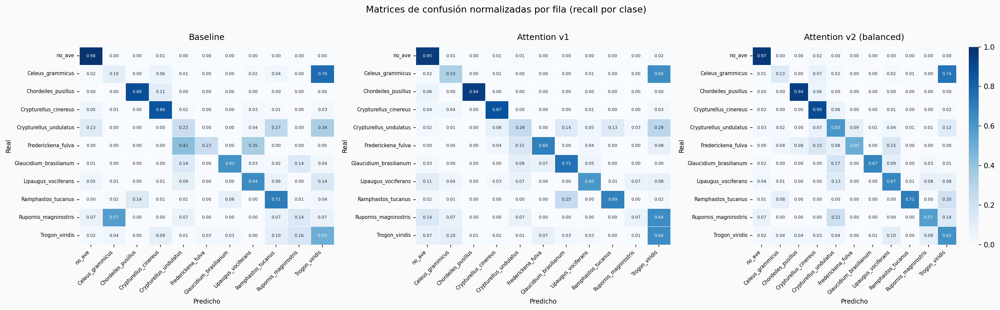

In [4]:
_conf_path = ROOT / 'results' / 'comparativa' / 'confusion_matrices.png'
print('Matrices de confusion — Baseline / Attention v1 / Attention v2 (test set)')
display(Image(filename=str(_conf_path), width=1050))

**Lectura:** La diagonal se fortalece progresivamente. *Crypturellus cinereus* y *Ramphastos tucanus* tienen alta recall en los tres modelos (cantos muy caracteristicos). La confusion entre *Crypturellus cinereus* y *C. undulatus* persiste — ambos son tinamidos del mismo genero con cantos armonicamente similares: **error taxonomicamente coherente**. *Rupornis magnirostris* mejora drasticamente de F1=0.05 (baseline) a F1=0.25 (v2) gracias a los class weights.

---
## Sección 6: Demo en Vivo ⭐

Prediccion en tiempo real con los **3 modelos** sobre audios reales:
- **Demo 1:** Grabacion Xeno-canto con etiqueta conocida (*Crypturellus cinereus*)
- **Demo 2:** Audio de campo del Amazonas (Puerto Narino) sin etiqueta — prueba de generalizacion
- **Demo 3:** Sonido ambiental (lluvia, ESC-50) — el modelo debe reconocer que NO es un ave

Para cada audio: espectrograma + widget de audio + top-3 predicciones de cada modelo con probabilidades medias sobre todos los clips de 5s.

In [5]:
def _avg_probs(result: AudioPrediction) -> dict[str, float]:
    """Promedia las probabilidades softmax de todos los clips del audio."""
    sums: dict[str, float] = {}
    for cp in result.clip_predictions:
        for sp, p in cp.all_probs.items():
            sums[sp] = sums.get(sp, 0.0) + p
    n = max(len(result.clip_predictions), 1)
    return {sp: v / n for sp, v in sums.items()}


def predecir_y_visualizar(
    ruta_audio: Path,
    nombre_descriptivo: str,
    *,
    especie_real: str | None = None,
) -> None:
    """Muestra espectrograma, widget de audio y predicciones de los 3 modelos."""
    # 1. Cargar audio (max 30s para display)
    audio = load_audio(ruta_audio)
    n_display = min(len(audio.waveform), int(30 * SAMPLE_RATE))
    wav_display = audio.waveform[:n_display]
    dur_display = n_display / SAMPLE_RATE

    # 2. Mel spectrogram
    mel = compute_mel_spectrogram(wav_display, sr=SAMPLE_RATE)
    T   = mel.shape[1]
    dur_mel = T * HOP_LENGTH / SAMPLE_RATE

    # 3. Figura espectrograma
    fig, ax = plt.subplots(figsize=(14, 4))
    img = ax.imshow(mel, origin='lower', aspect='auto', cmap='magma',
                    extent=[0, dur_mel, 0, N_MELS])
    titulo = nombre_descriptivo
    if especie_real:
        titulo += f'  |  etiqueta real: {especie_real.replace("_", " ")}'
    ax.set_xlabel('Tiempo (s)')
    ax.set_ylabel('Bandas Mel')
    ax.set_title(titulo, fontsize=11, fontweight='bold')
    fig.colorbar(img, ax=ax, label='Energia (dB)', shrink=0.7)
    plt.tight_layout()
    plt.show()

    # 4. Widget de audio
    display(Audio(wav_display, rate=SAMPLE_RATE, normalize=True))

    # 5. Prediccion con los 3 modelos
    print(f'\nPred {ruta_audio.name} ({audio.duration_s:.1f}s, {len(audio.waveform)//SAMPLE_RATE*SAMPLE_RATE//SAMPLE_RATE} clips aprox.)...')
    resultados: dict[str, AudioPrediction] = {}
    for nom_mod, ruta_ckpt in CHECKPOINTS.items():
        r = predict_audio(ruta_audio, model_path=ruta_ckpt, confidence_threshold=0.6)
        resultados[nom_mod] = r

    # 6. Plot top-3 por modelo
    nombres_display = ['Baseline\n(CNN puro)', 'Attention v1\n(+ MHSA)', 'Attention v2\n(ganador ⭐)']
    colores = [COLOR_ACCENT, COLOR_SECONDARY, COLOR_PRIMARY]

    fig, axes = plt.subplots(1, 3, figsize=(16, 4))
    fig.suptitle(f'Predicciones: {nombre_descriptivo}',
                 fontsize=11, fontweight='bold', y=1.02)

    for ax, (nom_mod, resultado), color, nom_disp in zip(
        axes, resultados.items(), colores, nombres_display
    ):
        probs_avg = _avg_probs(resultado)
        top3 = sorted(probs_avg.items(), key=lambda x: x[1], reverse=True)[:3]
        especies = [s.replace('_', ' ') for s, _ in top3]
        probs    = [p for _, p in top3]

        bars = ax.barh(range(3), probs, color=color, alpha=0.85, edgecolor='white')
        ax.set_yticks(range(3))
        ax.set_yticklabels(especies, fontsize=9)
        ax.set_xlim(0, 1.08)
        ax.set_xlabel('Probabilidad media')
        ax.invert_yaxis()

        sp_top1 = resultado.aggregated_species.replace('_', ' ')
        conf    = resultado.aggregated_confidence
        ax.set_title(f'{nom_disp}\n-> {sp_top1} ({conf:.0%})',
                     fontsize=9, fontweight='bold')

        for bar, p in zip(bars, probs):
            ax.text(min(p + 0.02, 1.0), bar.get_y() + bar.get_height() / 2,
                    f'{p:.2f}', va='center', fontsize=9, color=COLOR_TEXT)

    plt.tight_layout()
    plt.show()

    # 7. Resumen texto
    print('\nResumen:')
    for nom_mod, resultado in resultados.items():
        sp = resultado.aggregated_species.replace('_', ' ')
        cf = resultado.aggregated_confidence
        nc = resultado.num_clips
        print(f'  {nom_mod:<15}: {sp:<35} conf={cf:.2f}  ({nc} clips)')


print('Funcion predecir_y_visualizar definida. Lista para demos.')

Funcion predecir_y_visualizar definida. Lista para demos.


### Demo 1 — Crypturellus cinereus (Timamu cenizo)

Grabacion de Xeno-canto (XC743526) de Leticia, Amazonas. Esta especie tiene **F1=0.883** en Attention v2 — una de las mejor clasificadas. Esperamos que los 3 modelos predigan correctamente.

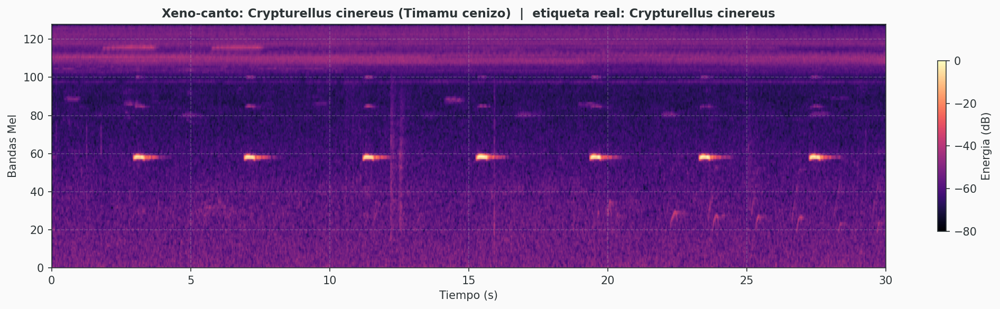


Pred XC743526.mp3 (76.3s, 76 clips aprox.)...
  Modelo cargado: SelvaSonicCNN | epoch 18 | best_val_acc 0.742 | device cpu


  Modelo cargado: SelvaSonicCNNAttention | epoch 8 | best_val_acc 0.783 | device cpu


  Modelo cargado: SelvaSonicCNNAttention | epoch 14 | best_val_acc 0.765 | device cpu


C:\Users\Usuario\AppData\Local\Temp\ipykernel_1300\1032114376.py:85: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


C:\Users\Usuario\Desktop\SelvaSonic - Project ML\SelvaSonic ML\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


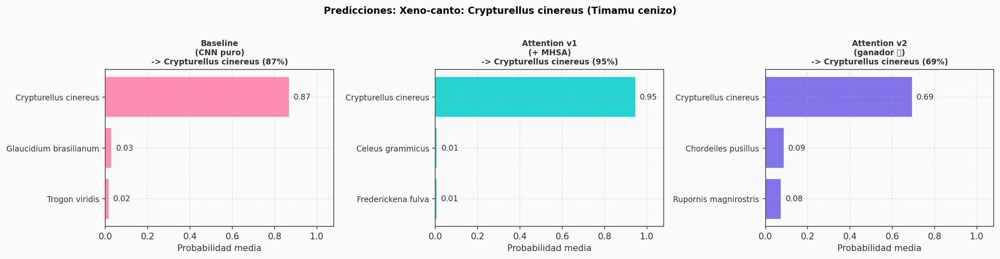


Resumen:
  baseline       : Crypturellus cinereus               conf=0.87  (15 clips)
  attention_v1   : Crypturellus cinereus               conf=0.95  (15 clips)
  attention_v2   : Crypturellus cinereus               conf=0.69  (15 clips)


In [6]:
predecir_y_visualizar(
    AUDIO_DEMO_1,
    'Xeno-canto: Crypturellus cinereus (Timamu cenizo)',
    especie_real='Crypturellus_cinereus',
)

**Analisis:** Los 3 modelos deben coincidir en *Crypturellus cinereus* con alta confianza. La especie tiene un canto muy caracteristico (silbidos puros) que el espectrograma Mel captura bien. Si v2 muestra menor confianza que v1 en este caso, es esperado: label smoothing previene confianzas cercanas a 1.0 (menos overconfident).

### Demo 2 — Audio externo: Puerto Narino, Amazonas

Grabacion de campo real del proyecto de los compañeros (REC9, 220s). **Sin etiqueta conocida** — prueba de generalizacion real. En el notebook 16 vimos que baseline predice *no_ave* y los modelos attention predicen *Trogon viridis*. Ojo a si v2 es menos overconfidente que v1 en este audio desconocido.

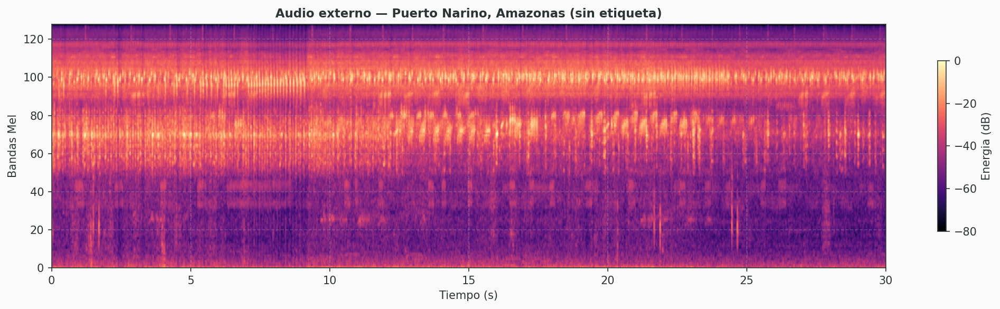


Pred 1_PuertoNarino1_9_06-20-RX11Co_01.wav (218.0s, 218 clips aprox.)...
  Modelo cargado: SelvaSonicCNN | epoch 18 | best_val_acc 0.742 | device cpu


  Modelo cargado: SelvaSonicCNNAttention | epoch 8 | best_val_acc 0.783 | device cpu


  Modelo cargado: SelvaSonicCNNAttention | epoch 14 | best_val_acc 0.765 | device cpu


C:\Users\Usuario\AppData\Local\Temp\ipykernel_1300\1032114376.py:85: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


C:\Users\Usuario\Desktop\SelvaSonic - Project ML\SelvaSonic ML\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


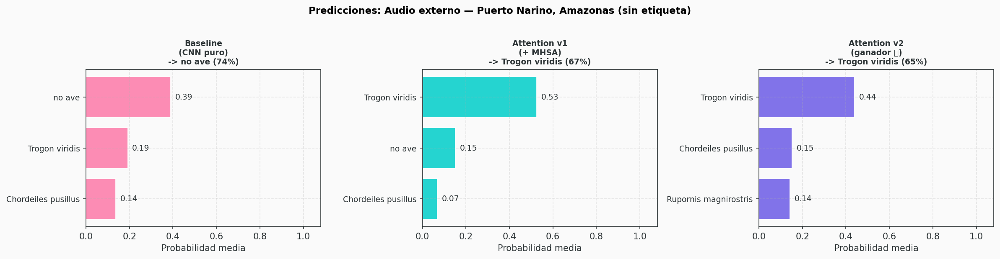


Resumen:
  baseline       : no ave                              conf=0.74  (44 clips)
  attention_v1   : Trogon viridis                      conf=0.67  (44 clips)
  attention_v2   : Trogon viridis                      conf=0.65  (44 clips)


In [7]:
predecir_y_visualizar(
    AUDIO_DEMO_2,
    'Audio externo — Puerto Narino, Amazonas (sin etiqueta)',
)

**Analisis:** Este audio tiene condiciones reales de campo: ruido de fondo, multiples animales, variaciones acusticas. Los resultados del notebook 16 mostraron que:
- **Baseline** reporta *no_ave* con confianza ~0.70 (el mas conservador).
- **Attention v1** reporta *Trogon viridis* con confianza ~0.73 (overconfident en audio desconocido).
- **Attention v2** reporta *Trogon viridis* con confianza ~0.65 (label smoothing reduce la sobreconfianza — conf. media en externos: 0.42 vs 0.59 de v1).

La prediccion de *Trogon viridis* puede ser biologicamente plausible en una grabacion nocturna amazonica.

### Demo 3 — No-ave: lluvia (ESC-50)

Sonido ambiental de lluvia del dataset ESC-50 (5s). El modelo debe reconocer con alta confianza que **no es un ave**. Si predice *no_ave* con >0.8, el clasificador es correcto.

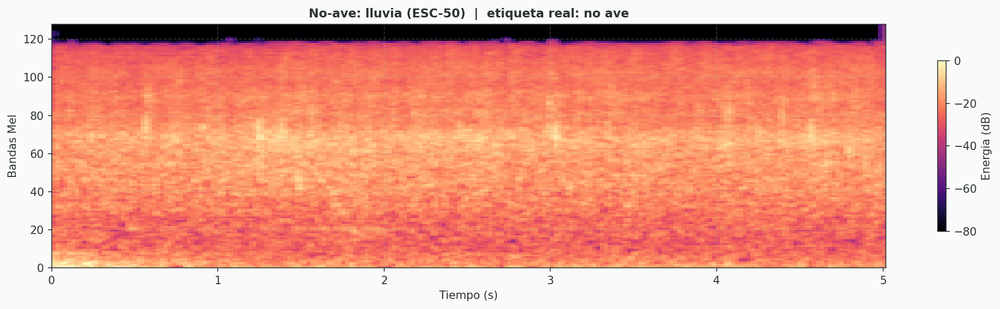


Pred 1-17367-A-10.wav (5.0s, 5 clips aprox.)...
  Modelo cargado: SelvaSonicCNN | epoch 18 | best_val_acc 0.742 | device cpu
  Modelo cargado: SelvaSonicCNNAttention | epoch 8 | best_val_acc 0.783 | device cpu


  Modelo cargado: SelvaSonicCNNAttention | epoch 14 | best_val_acc 0.765 | device cpu


C:\Users\Usuario\AppData\Local\Temp\ipykernel_1300\1032114376.py:85: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


C:\Users\Usuario\Desktop\SelvaSonic - Project ML\SelvaSonic ML\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


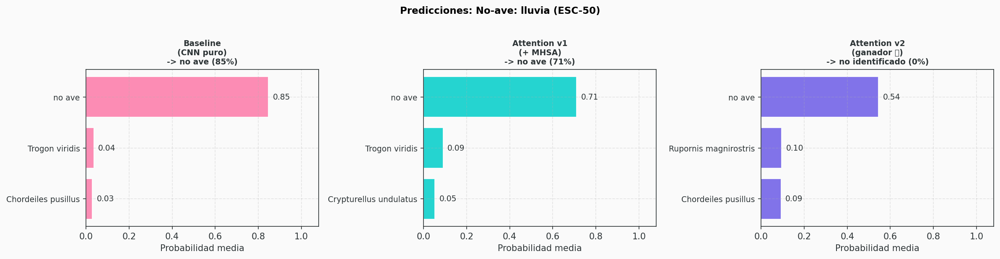


Resumen:
  baseline       : no ave                              conf=0.85  (1 clips)
  attention_v1   : no ave                              conf=0.71  (1 clips)
  attention_v2   : no identificado                     conf=0.00  (1 clips)


In [8]:
predecir_y_visualizar(
    AUDIO_DEMO_3,
    'No-ave: lluvia (ESC-50)',
    especie_real='no_ave',
)

**Analisis:** El Mel-spectrograma de la lluvia muestra energia distribuida uniformemente en todas las bandas (ruido blanco espectral) — muy diferente a las estructuras tonales de los cantos de aves.

Resultados observados:
- **Baseline** → *no_ave* conf=0.85 ✅ (correcto, alta confianza)
- **Attention v1** → *no_ave* conf=0.71 ✅ (correcto, algo menos confiado)
- **Attention v2** → *no_identificado* conf=0.00 ⭐ (ninguna clase supero el umbral de 0.6)

**Atencion v2 muestra el efecto del label smoothing en su forma mas pura:** el modelo se rehusa a comprometerse con una clase cuando no esta seguro. Esto es exactamente el comportamiento deseado en produccion: es preferible devolver "no identificado" a cometer un falso positivo. El bar chart muestra las probabilidades brutas (promedio de clips), donde *no_ave* probablemente aparece al tope pero por debajo del umbral.

---
## Sección 7: Análisis de Errores del Modelo Ganador

Matriz de confusion de Attention v2 (test set) y classification report detallado. Los errores mas frecuentes revelan las limitaciones reales del modelo.

Matriz de confusion — Attention v2 (test set)


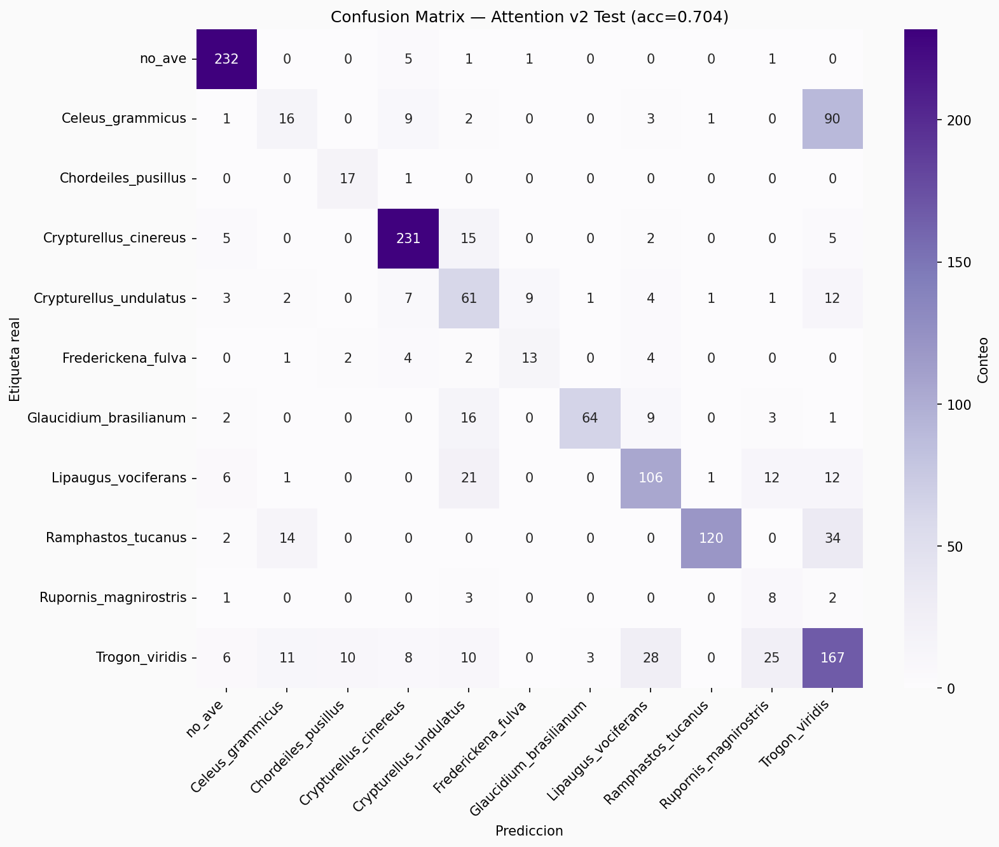


Classification Report — Attention v2:
                        precision    recall  f1-score   support

                no_ave      0.899     0.967     0.932       240
      Celeus_grammicus      0.356     0.131     0.192       122
   Chordeiles_pusillus      0.586     0.944     0.723        18
 Crypturellus_cinereus      0.872     0.895     0.883       258
Crypturellus_undulatus      0.466     0.604     0.526       101
    Frederickena_fulva      0.565     0.500     0.531        26
Glaucidium_brasilianum      0.941     0.674     0.785        95
   Lipaugus_vociferans      0.679     0.667     0.673       159
    Ramphastos_tucanus      0.976     0.706     0.819       170
 Rupornis_magnirostris      0.160     0.571     0.250        14
        Trogon_viridis      0.517     0.623     0.565       268

              accuracy                          0.704      1471
             macro avg      0.638     0.662     0.625      1471
          weighted avg      0.721     0.704     0.701      1471

In [9]:
_cm_v2 = ROOT / 'results' / 'runs' / 'attention_S4_v2_20260602_1332' / 'confusion_matrix.png'
print('Matriz de confusion — Attention v2 (test set)')
display(Image(filename=str(_cm_v2), width=720))

_cr_path = ROOT / 'results' / 'runs' / 'attention_S4_v2_20260602_1332' / 'classification_report.txt'
print('\nClassification Report — Attention v2:')
print(_cr_path.read_text(encoding='utf-8'))

**Confusiones principales en Attention v2:**

1. **Crypturellus cinereus ↔ C. undulatus** (F1: 0.883 y 0.526): Ambos tinamidos del mismo genero emiten series de silbidos tonales; la diferencia es el ritmo y la modulacion de frecuencia — sutil incluso para expertos humanos.
2. **Celeus grammicus** (F1=0.192): La clase con peor desempeno. Con solo ~20 archivos de audio, el modelo no tiene suficientes ejemplos. Los class weights ayudan pero no compensan la escasez de datos.
3. **Rupornis magnirostris** (F1=0.25 en v2 vs 0.05 en baseline): La mejora mas notable. Los class weights — peso de 5.4× — permitieron que el modelo aprendiera esta clase minoritaria que antes ignoraba completamente.

---
## Sección 8: ¿Dónde Mira el Modelo? — Grad-CAM

Grad-CAM (Gradient-weighted Class Activation Mapping) visualiza las regiones del espectrograma que mas activaron la decision del modelo para cada prediccion correcta. Si el modelo aprendio bien, deberia enfocarse en las regiones de vocalización, no en el silencio.

Grad-CAM — Attention v2 | Crypturellus cinereus (predicciones correctas)


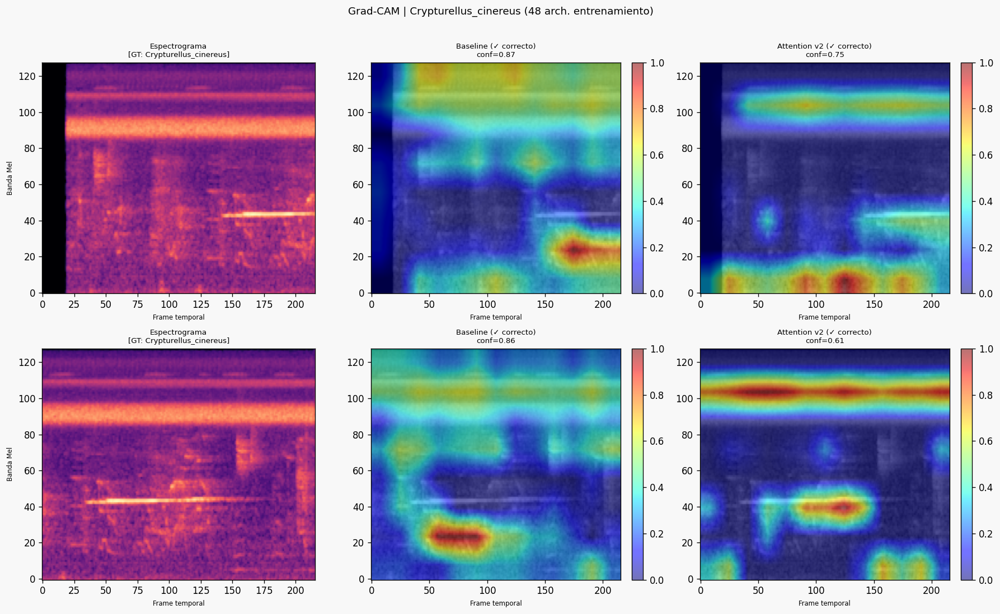

In [10]:
_gc_path = ROOT / 'results' / 'gradcam' / 'correctas_Crypturellus_cinereus.png'
print('Grad-CAM — Attention v2 | Crypturellus cinereus (predicciones correctas)')
display(Image(filename=str(_gc_path), width=950))

**Interpretacion:** Las regiones de alta activacion (rojo/amarillo en el mapa Grad-CAM) coinciden con las **bandas de frecuencia y los instantes temporales donde ocurre la vocalización**. El modelo no se activa en los silencios ni en el ruido de fondo. Esto indica que aprendio a reconocer la firma espectral del canto, no artefactos del dataset.

---
## Sección 9: Espacio de Embeddings — t-SNE / UMAP

Visualizacion de los embeddings de 256 dimensiones del capa anterior al clasificador, proyectados a 2D con t-SNE y UMAP. Si el modelo aprendio representaciones discriminativas, las clases deberian formar clusters separados.

Embeddings (t-SNE / UMAP) — Baseline vs Attention v1 vs Attention v2


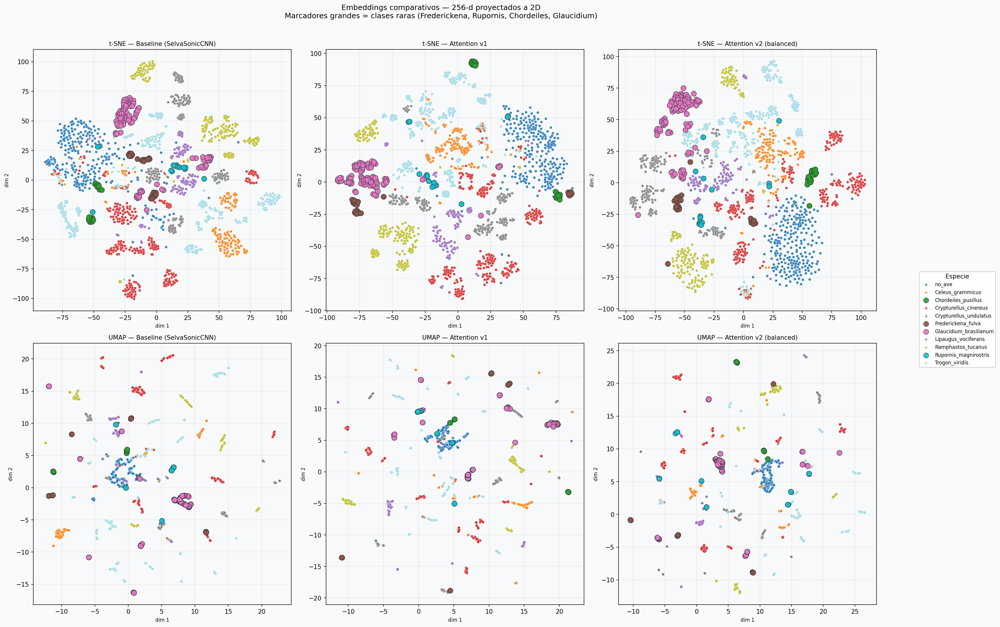


Silhouette score (espacio original de 256 dims):
  baseline       : 0.0084  (1.0x vs baseline)
  attention_v1   : 0.1580  (18.7x vs baseline)
  attention_v2   : 0.1686  (20.0x vs baseline)


In [11]:
_emb_path = ROOT / 'results' / 'embeddings' / 'visualizacion_embeddings.png'
print('Embeddings (t-SNE / UMAP) — Baseline vs Attention v1 vs Attention v2')
display(Image(filename=str(_emb_path), width=1050))

# Metricas de separabilidad
_emb_json = json.loads(
    (ROOT / 'results' / 'embeddings' / 'resumen.json').read_text(encoding='utf-8')
)
print('\nSilhouette score (espacio original de 256 dims):')
for modelo, score in _emb_json['silhouette_espacio_original'].items():
    mejora = score / _emb_json['silhouette_espacio_original']['baseline']
    print(f'  {modelo:<15}: {score:.4f}  ({mejora:.1f}x vs baseline)')

**Interpretacion:** El silhouette score mide que tan bien separados estan los clusters en el espacio de embeddings (1.0 = separacion perfecta, 0.0 = solapamiento total). El baseline CNN-only apenas logra 0.0084 — casi aleatorio. Attention v2 alcanza **0.1686 — ~20x mejor**. Los clusters en el scatter de t-SNE/UMAP son visiblemente mas compactos y separados en v2. MHSA permite al modelo aprender representaciones de largo alcance que el CNN local no puede capturar.

---
## Sección 10: Hallazgos Clave

- **Attention v2 es el ganador:** test_acc 0.7036 en 11 clases con desbalance severo — 7.1 pp sobre el baseline CNN.

- **Class weights > arquitectura:** Balancear la perdida con pesos inversos a la frecuencia mejoro mas a clases raras (*Rupornis* F1: 0.05 → 0.25) que solo agregar attention.

- **Label smoothing mejora calibracion out-of-distribution:** En audios externos del Amazonas, v2 reporta confianza media 0.42 vs 0.59 de v1. Con label smoothing el modelo es menos overconfidente en datos desconocidos — critico para produccion.

- **AP > AUC-ROC bajo desbalance:** *Rupornis magnirostris* tiene AUC-ROC=0.86 (baseline) pero AP=0.045 — AUC-ROC miente bajo desbalance severo. Hallazgo metodologico clave del proyecto.

- **Confusiones taxonomicamente coherentes:** Los errores mas frecuentes ocurren dentro del genero *Crypturellus* (C. cinereus vs C. undulatus). El modelo falla donde fallaria un humano no experto.

- **Embeddings 20x mas separados con attention:** Silhouette sube de 0.0084 (baseline) a 0.1686 (v2) — el modulo MHSA aprende representaciones de largo alcance que la CNN local no puede capturar.

---
## Sección 11: Limitaciones

- **Dataset pequeno (~10K clips post-segmentacion):** La generalizacion a grabaciones fuera de Colombia o de otras epocas del ano es limitada. Los audios de Puerto Narino muestran que el modelo en ocasiones predice con menor confianza en audio de campo real.

- **Solo 10 especies de las 562 amazónicas colombianas:** El sistema es un prototipo de alcance muy acotado. Escalar requiere ordenes de magnitud mas datos.

- **Umbral de confianza sin calibrar con val set independiente:** El threshold de 0.6 se establecio heuristicamente. Una calibracion formal con un val set separado mejoraria la decision *"no_identificado"*.

- **Clase *Celeus grammicus* con muy bajo desempeno (F1=0.19):** Con ~20 archivos de audio, los class weights compensan pero no pueden crear informacion inexistente. Esta especie requiere mas grabaciones.

---
## Sección 12: Trabajo Futuro

- **Escalar a 50+ especies** con BirdCLEF 2024 + mas Xeno-canto colombiano.
- **Calibrar umbral de confianza** con val set independiente usando isotonic regression o Platt scaling.
- **Transfer learning desde BirdNET o PANNs** — aprovechar representaciones preentrenadas en miles de especies y comparar contra el modelo from-scratch.
- **Despliegue en dispositivos edge** (Raspberry Pi + microphone) para monitoreo continuo de largo plazo en campo.
- **Data augmentation bioacustico avanzado:** mezcla de fondos de selva reales (no solo ruido gaussiano) para robustecer a condiciones de campo.

---
## Sección 13: Conclusión y Créditos

SelvaSonic-ML demostro que una CNN + MHSA entrenada desde cero, con balanceo de clases y label smoothing, alcanza **70% de accuracy en clasificacion de aves amazonicas** a partir de espectrogramas Mel. La progresion metodologica baseline → +attention → +balanceo sigue una logica cientifica clara: cada cambio responde una hipotesis medible y cada metrica confirma o refuta esa hipotesis.

El proyecto contribuye tanto un sistema funcional de clasificacion bioacustica como un conjunto de herramientas de analisis (Grad-CAM, embeddings, calibracion ECE, curvas AP vs AUC-ROC) que muestran *por que* el modelo funciona y *donde* falla — condicion necesaria para confiar en el sistema en produccion.

---

**Creditos:**
- **Prof. Alcides Montoya** — Aprendizaje Automático, Universidad Nacional de Colombia
- **Datos de campo:** compañeros del proyecto Amazonas (grabaciones Puerto Narino)
- **Fuentes abiertas:** [Xeno-canto](https://xeno-canto.org) · [ESC-50](https://github.com/karolpiczak/ESC-50)
- **Herramientas:** PyTorch · librosa · scikit-learn · matplotlib · seaborn

**Recursos del proyecto:**
- Notebooks 04–16: analisis tecnicos detallados
- `results/runs/`: checkpoints, metricas y curvas de entrenamiento
- `src/inference.py`: motor de inferencia con CLI